### Zadania

Celem zadań jest napisanie (fragmentów) programów, które wyodrębnią obiekty znajdujące się na podanych obrazach. Rozumie się przez to doprowadzenie obrazów do postaci binarnej z wyraźną separacją między obiektami a tłem oraz poszczególnymi obiektami.

In [1]:
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

##### Zad. 1: Monety szare (1 pkt)

Dane są dwa czarno-białe obrazy monet, `monety_szare` oraz `monety_szare_szum`, z których drugi zawiera pewien poziom zakłóceń. Dokonaj binaryzacji tych obrazów za pomocą progowania. W jaki sposób ustalisz wartość progu? Jaki wpływ mają zakłócenia w drugim obrazie? Jak się ich pozbędziesz?

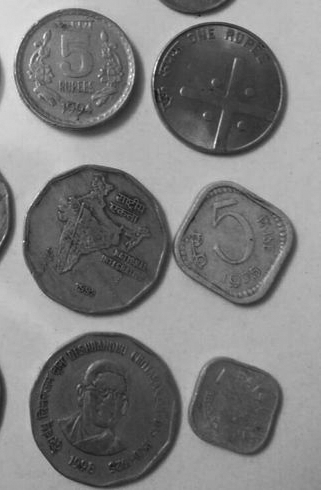

In [3]:
# 1A
monety_szare = cv2.imread('Monety_szare.bmp')
Image.fromarray(cv2.cvtColor(monety_szare, cv2.COLOR_BGR2RGB))

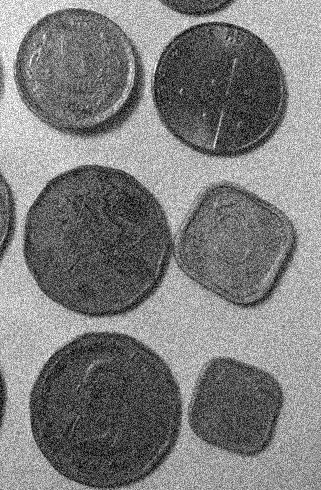

In [4]:
# 1B
monety_szare_szum = cv2.imread('Monety_szare_szum.bmp')
Image.fromarray(cv2.cvtColor(monety_szare_szum, cv2.COLOR_BGR2RGB))

Rozwiązanie części 1A:

Próg:  135.0


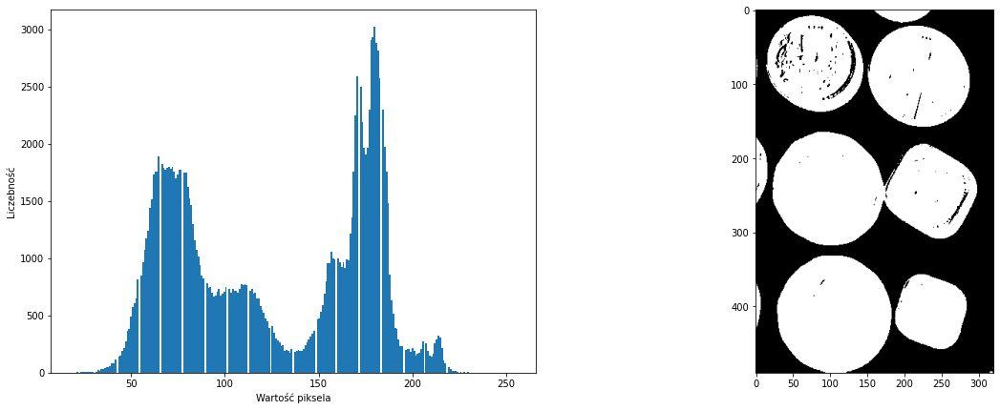

In [5]:
img_Gray = cv2.cvtColor(monety_szare, cv2.COLOR_BGR2GRAY)

fig, ax = plt.subplots(1,2, figsize=(20,7))
ax[0].hist(img_Gray.flatten(), bins=255);
ax[0].set_ylabel('Liczebność')
ax[0].set_xlabel('Wartość piksela')

(T, img_threshInv) = cv2.threshold(img_Gray, 135, 255, cv2.THRESH_BINARY_INV)

print('Próg: ',T)

img = Image.fromarray(img_threshInv)

ax[1].imshow(img, cmap='gray')
plt.savefig('zad1v1')

Rozwiązanie części 1B:


Próg:  135.0


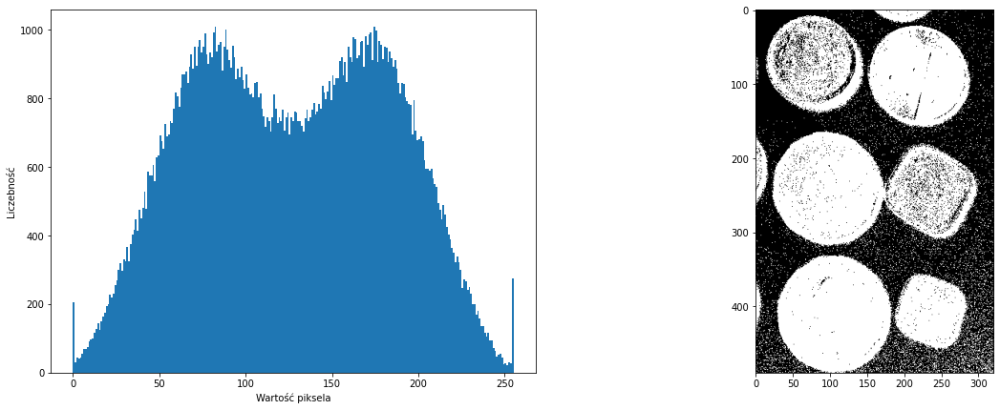

In [6]:
# Bez filtrowania
img_Gray2 = cv2.cvtColor(monety_szare_szum, cv2.COLOR_BGR2GRAY)


fig, ax = plt.subplots(1,2, figsize=(20,7))
ax[0].hist(img_Gray2.flatten(), bins=255);
ax[0].set_ylabel('Liczebność')
ax[0].set_xlabel('Wartość piksela')


(T, img_threshInv2) = cv2.threshold(img_Gray2, 135, 255, cv2.THRESH_BINARY_INV)

print('Próg: ',T)

img = Image.fromarray(img_threshInv2)
ax[1].imshow(img, cmap='gray')
plt.savefig('zad1v2')

Próg:  135.0


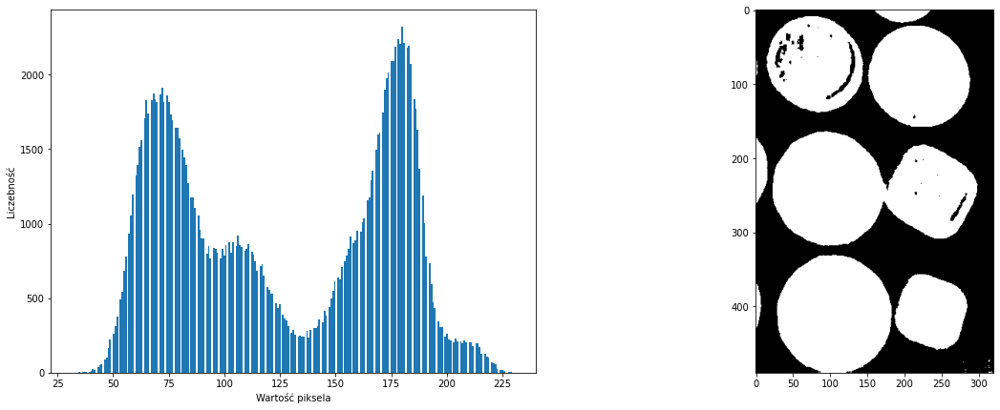

In [7]:
# Z filtrowaniem
kernel_blur_matrix = np.array([[1, 1, 1, 1, 1], 
                               [1, 1, 1, 1, 1], 
                               [1, 1, 1, 1, 1], 
                               [1, 1, 1, 1, 1], 
                               [1, 1, 1, 1, 1]])/25

odszumiony = cv2.filter2D(src=monety_szare_szum, ddepth=-1, kernel=kernel_blur_matrix)

fig, ax = plt.subplots(1,2, figsize=(20,7))
# Image.fromarray(odszumiony)
img_Gray3 = cv2.cvtColor(odszumiony, cv2.COLOR_BGR2GRAY)
ax[0].hist(img_Gray3.flatten(), bins=255);
ax[0].set_ylabel('Liczebność')
ax[0].set_xlabel('Wartość piksela')

(T, img_threshInv3) = cv2.threshold(img_Gray3, 135, 255, cv2.THRESH_BINARY_INV)

print('Próg: ',T)

img = Image.fromarray(img_threshInv3)
ax[1].imshow(img, cmap='gray')
plt.savefig('zad1v3')

##### Zad. 2: Monety kolorowe (1pkt)

Na podobnej zasadzie dokonaj binaryzacji poniższych obrazów kolorowych. Skorzystaj z modelu barw HSV. Posłuż się kształtem histogramu dla wybranej składowej.

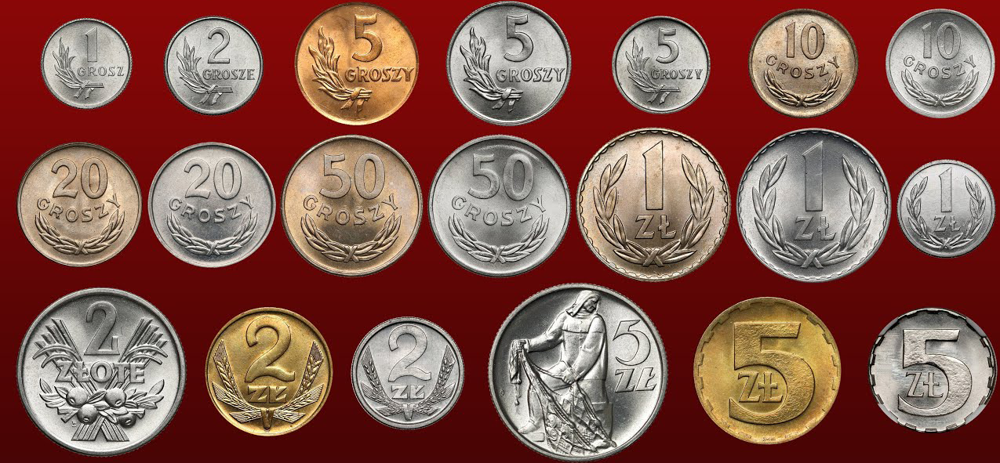

In [8]:
# 2A
monety_kolor = cv2.imread('Monety_kolor.bmp')
Image.fromarray(cv2.cvtColor(monety_kolor, cv2.COLOR_BGR2RGB))

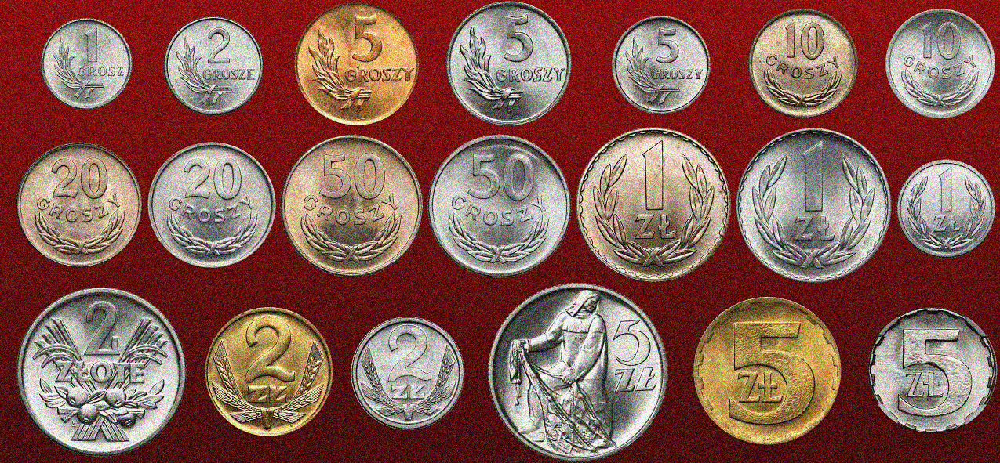

In [9]:
# 2B
monety_kolor_szum = cv2.imread('Monety_kolor_szum.bmp')
Image.fromarray(cv2.cvtColor(monety_kolor_szum, cv2.COLOR_BGR2RGB))

Rozwiązanie części 2A:

In [10]:
def make_hist(monety):
    fig, ax = plt.subplots(3,2, figsize=(25,10))

    ax[0][0].imshow(monety[:,:,0], cmap='gray')
    ax[1][0].imshow(monety[:,:,1], cmap='gray')
    ax[2][0].imshow(monety[:,:,2], cmap='gray')

    ax[0][1].hist(monety[:,:,0].flatten(), bins=255);
    ax[1][1].hist(monety[:,:,1].flatten(), bins=255);
    ax[2][1].hist(monety[:,:,2].flatten(), bins=255);

    for i in range(3):
        ax[i][1].set_ylabel('Liczebność')
        ax[i][1].set_xlabel('Wartość piksela')
    
    plt.tight_layout() 

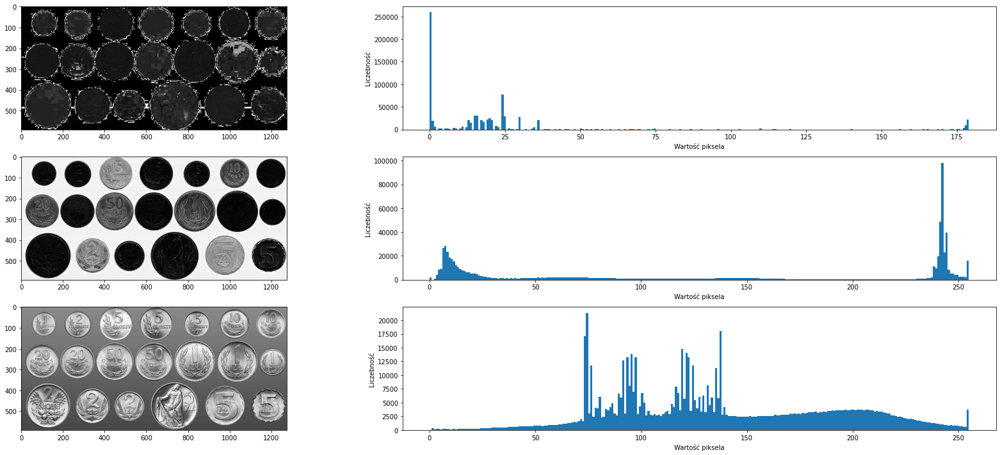

In [11]:
monety_kolor_hsv = cv2.cvtColor(monety_kolor, cv2.COLOR_BGR2HSV)
# print(monety_kolor_hsv.shape)

# fig, ax = plt.subplots(3,2, figsize=(10,15))

# ax[0][0].imshow(monety_kolor_hsv[:,:,0])
# ax[1][0].imshow(monety_kolor_hsv[:,:,1])
# ax[2][0].imshow(monety_kolor_hsv[:,:,2])

# ax[0][1].hist(monety_kolor_hsv[:,:,0].flatten(), bins=255);
# ax[1][1].hist(monety_kolor_hsv[:,:,1].flatten(), bins=255);
# ax[2][1].hist(monety_kolor_hsv[:,:,2].flatten(), bins=255);

# plt.tight_layout()
make_hist(monety_kolor_hsv)
plt.savefig('zad2obraz1v1.png')

Próg:  200.0


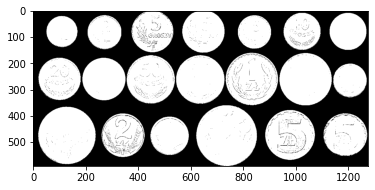

In [29]:
(T, monety_threshInv3) = cv2.threshold(monety_kolor_hsv[:,:,1], 200, 255, cv2.THRESH_BINARY_INV)

print('Próg: ',T)

img = Image.fromarray(monety_threshInv3)
plt.imshow(img, cmap='gray')
plt.savefig('zad2obraz1bin1.png')

Próg:  170.0


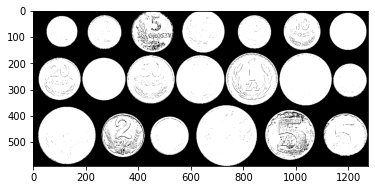

In [30]:
(T, monety_threshInv3) = cv2.threshold(monety_kolor_hsv[:,:,1], 170, 255, cv2.THRESH_BINARY_INV)

print('Próg: ',T)

img = Image.fromarray(monety_threshInv3)
plt.imshow(img, cmap='gray')
plt.savefig('zad2obraz1bin2.png')

Rozwiązanie części 2B:


In [13]:
def make_hist2(monety):
    fig, ax = plt.subplots(3,2, figsize=(20,10))

    ax[0][0].imshow(monety[:,:,0], cmap='gray')
    ax[1][0].imshow(monety[:,:,1], cmap='gray')
    ax[2][0].imshow(monety[:,:,2], cmap='gray')
    
    counts, bins = np.histogram(monety[:,:,0].flatten(), range(257))
    ax[0][1].bar(bins[:-2] - 0.5, counts[:-1], width=1, edgecolor='none')
    counts, bins = np.histogram(monety[:,:,1].flatten(), range(257))
    ax[1][1].bar(bins[:-2] - 0.5, counts[:-1], width=1, edgecolor='none')
    counts, bins = np.histogram(monety[:,:,2].flatten(), range(257))
    ax[2][1].bar(bins[:-2] - 0.5, counts[:-1], width=1, edgecolor='none')
   
    for i in range(3):
        ax[i][1].set_ylabel('Liczebność')
        ax[i][1].set_xlabel('Wartość piksela')
    
    plt.tight_layout() 

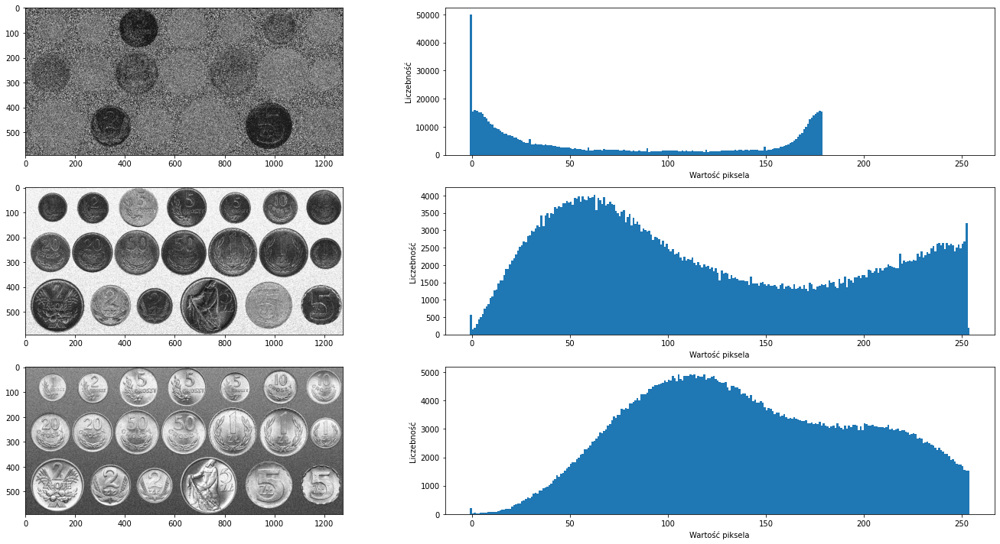

In [14]:
monety_kolor_szum_hsv = cv2.cvtColor(monety_kolor_szum, cv2.COLOR_BGR2HSV)
# fig, ax = plt.subplots(3,2, figsize=(20,10))

# ax[0][0].imshow(monety_kolor_szum_hsv[:,:,0])
# ax[1][0].imshow(monety_kolor_szum_hsv[:,:,1])
# ax[2][0].imshow(monety_kolor_szum_hsv[:,:,2])

# # ax[0][1].hist(monety_kolor_szum_hsv[:,:,0].flatten(), bins=255);
# counts, bins = np.histogram(monety_kolor_szum_hsv[:,:,0].flatten(), range(257))
# # plot histogram centered on values 0..255
# ax[0][1].bar(bins[:-2] - 0.5, counts[:-1], width=1, edgecolor='none')
# # ax[0][1].set_xlim([-0.5, 255.5])

# # calculate histogram
# counts, bins = np.histogram(monety_kolor_szum_hsv[:,:,1].flatten(), range(257))
# # plot histogram centered on values 0..255
# ax[1][1].bar(bins[:-2] - 0.5, counts[:-1], width=1, edgecolor='none')
# # ax[1][1].set_xlim([-0.5, 255.5])

# # ax[1][1].hist(monety_kolor_hsv[:,:, 0].flatten(), bins=255)
# counts, bins = np.histogram(monety_kolor_szum_hsv[:,:,2].flatten(), range(257))
# # plot histogram centered on values 0..255
# ax[2][1].bar(bins[:-2] - 0.5, counts[:-1], width=1, edgecolor='none')
# # ax[2][1].set_xlim([-0.5, 255.5])
# # ax[2][1].hist(monety_kolor_szum_hsv[:,:,2].flatten(), bins=255);

# plt.tight_layout()


make_hist2(monety_kolor_szum_hsv)

plt.savefig('zad2obraz2v1.png')

Próg:  180.0


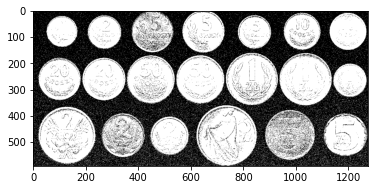

In [20]:
(T, monety_szum_threshInv3) = cv2.threshold(monety_kolor_szum_hsv[:,:,1], 180, 255, cv2.THRESH_BINARY_INV)

print('Próg: ',T)

img = Image.fromarray(monety_szum_threshInv3)
plt.imshow(img, cmap='gray')
plt.savefig('zad2szumv1.png')

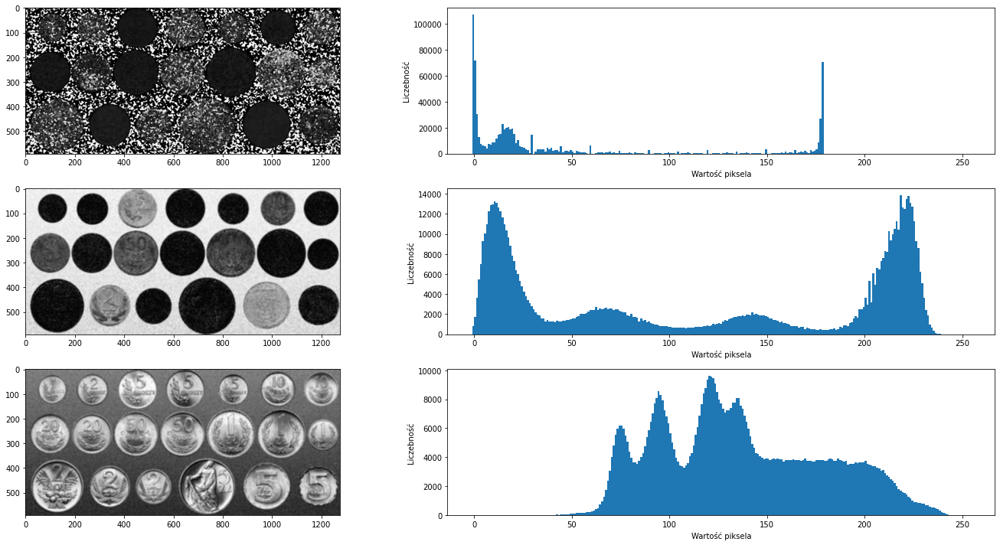

In [21]:
monety_kolor_noszum = cv2.GaussianBlur(monety_kolor_szum,(7,7),cv2.BORDER_DEFAULT)
monety_kolor_noszum_hsv = cv2.cvtColor(monety_kolor_noszum, cv2.COLOR_BGR2HSV)

# fig, ax = plt.subplots(3,2, figsize=(10,15))

# ax[0][0].imshow(monety_kolor_noszum_hsv[:,:,0], cmap='gray')
# ax[1][0].imshow(monety_kolor_noszum_hsv[:,:,1], cmap='gray')
# ax[2][0].imshow(monety_kolor_noszum_hsv[:,:,2], cmap='gray')

# ax[0][1].hist(monety_kolor_noszum_hsv[:,:,0].flatten(), bins=255);
# ax[1][1].hist(monety_kolor_noszum_hsv[:,:,1].flatten(), bins=255);
# ax[2][1].hist(monety_kolor_noszum_hsv[:,:,2].flatten(), bins=255);

# plt.tight_layout()
make_hist2(monety_kolor_noszum_hsv)
plt.savefig('zad2obraz2v2.png')

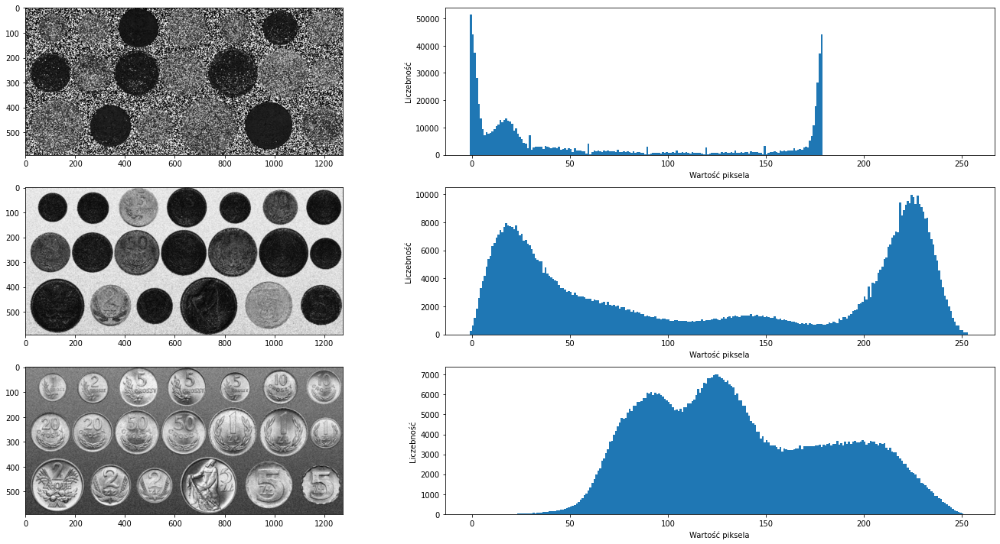

In [26]:
monety_kolor_noszum2 = cv2.GaussianBlur(monety_kolor_szum,(3,3),cv2.BORDER_DEFAULT)
monety_kolor_noszum_hsv2 = cv2.cvtColor(monety_kolor_noszum2, cv2.COLOR_BGR2HSV)

# fig, ax = plt.subplots(3,2, figsize=(10,15))

# ax[0][0].imshow(monety_kolor_noszum_hsv[:,:,0], cmap='gray')
# ax[1][0].imshow(monety_kolor_noszum_hsv[:,:,1], cmap='gray')
# ax[2][0].imshow(monety_kolor_noszum_hsv[:,:,2], cmap='gray')

# ax[0][1].hist(monety_kolor_noszum_hsv[:,:,0].flatten(), bins=255);
# ax[1][1].hist(monety_kolor_noszum_hsv[:,:,1].flatten(), bins=255);
# ax[2][1].hist(monety_kolor_noszum_hsv[:,:,2].flatten(), bins=255);

# plt.tight_layout()
make_hist2(monety_kolor_noszum_hsv2)
plt.savefig('zad2obraz2v3.png')

Próg:  180.0
Próg:  180.0
Próg:  180.0


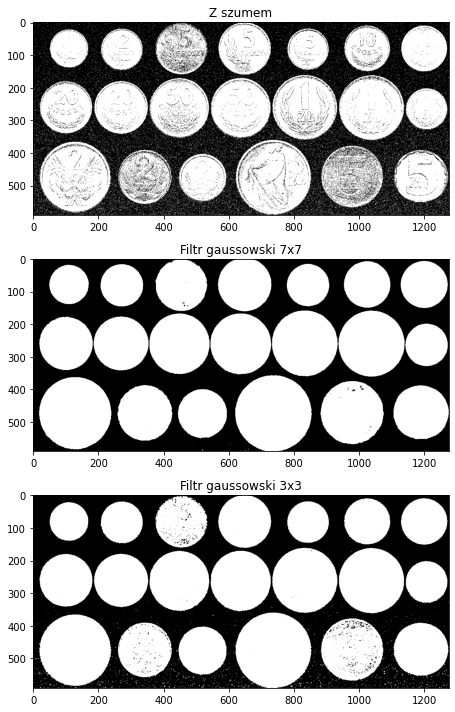

In [30]:
fig, ax = plt.subplots(3,1,figsize=(20,10))
(T, monety_szum_threshInv3) = cv2.threshold(monety_kolor_szum_hsv[:,:,1], 180, 255, cv2.THRESH_BINARY_INV)

print('Próg: ',T)

img1 = Image.fromarray(monety_szum_threshInv3)
ax[0].imshow(img1, cmap='gray')
ax[0].set_title('Z szumem')

(T, monety_szum_threshInv3) = cv2.threshold(monety_kolor_noszum_hsv[:,:,1], 180, 255, cv2.THRESH_BINARY_INV)

print('Próg: ',T)

img2 = Image.fromarray(monety_szum_threshInv3)
ax[1].imshow(img2, cmap='gray')
ax[1].set_title('Filtr gaussowski 7x7')

(T, monety_szum_threshInv3) = cv2.threshold(monety_kolor_noszum_hsv2[:,:,1], 180, 255, cv2.THRESH_BINARY_INV)

print('Próg: ',T)

img3 = Image.fromarray(monety_szum_threshInv3)
ax[2].imshow(img3, cmap='gray')
ax[2].set_title('Filtr gaussowski 3x3')

plt.tight_layout()

plt.savefig('zad2all.png')

##### Zad. 3: Tekst (1 pkt)

W tym przypadku należy wyodrębnić litery od bardzo nierównomiernie oświetlonego tła. Skorzystaj z binaryzacji metodą Otsu. Zastosuj binaryzację w sposób lokalny (oknem przesuwnym). Jaki wpływ ma rozmiar okna na jakość binaryzacji? Jak przesuwać okno?

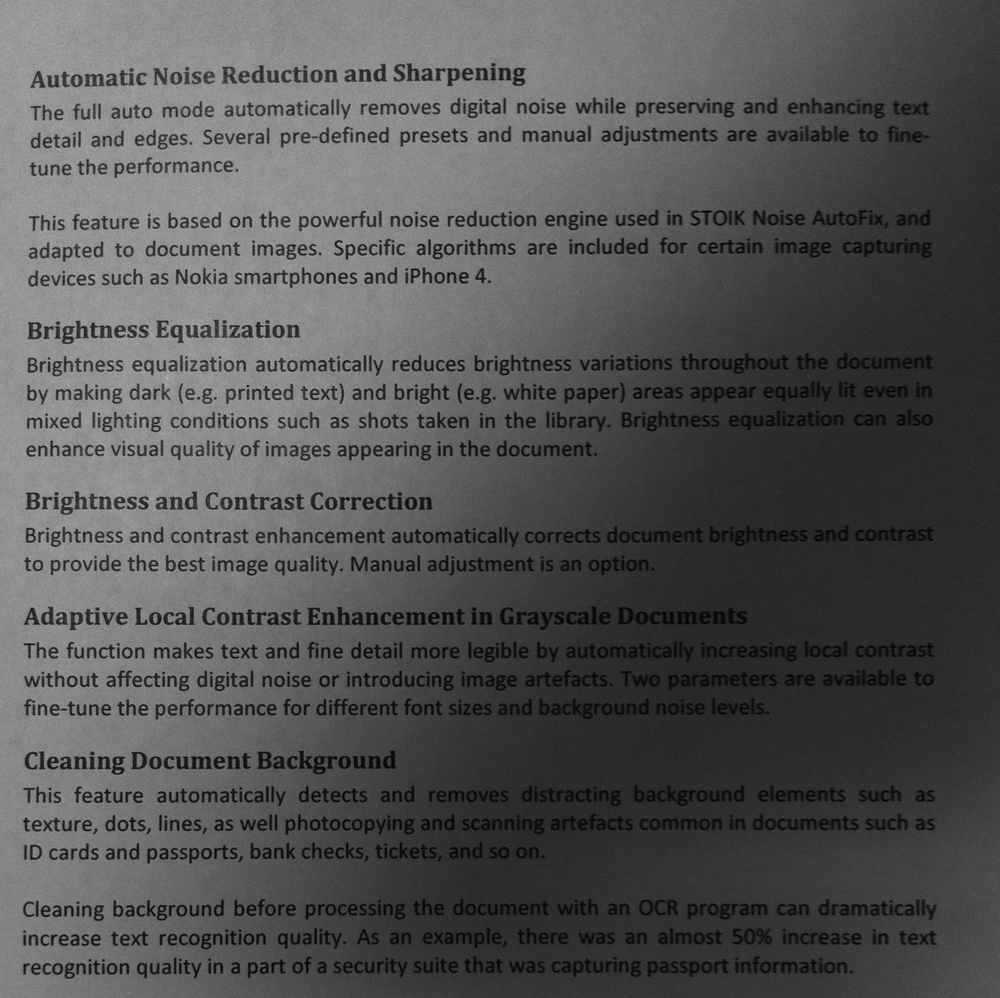

In [2]:
tekst = cv2.imread('Tekst1.bmp')
Image.fromarray(cv2.cvtColor(tekst, cv2.COLOR_BGR2GRAY))

Rozwiązanie:

In [3]:
from copy import deepcopy

In [4]:
tekst2 = deepcopy(tekst)
print(tekst2.shape)


(1731, 1734, 3)


In [6]:
tekst_Gray = cv2.cvtColor(tekst2, cv2.COLOR_BGR2GRAY)
print(tekst_Gray.shape)

(1731, 1734)


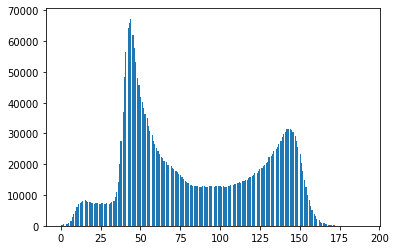

In [92]:
plt.hist(img_Gray.flatten(), bins=255);

Próg:  89.0


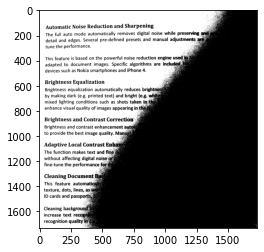

In [29]:
(T, otsu_thresh) = cv2.threshold(tekst_Gray, 0, 255,  cv2.THRESH_BINARY + cv2.THRESH_OTSU)

print('Próg: ',T)

img_otsu = Image.fromarray(otsu_thresh)
plt.imshow(img_otsu, cmap='gray')
plt.savefig('otsuraw.png')

In [11]:
def otsu_local(img, tile_size):
    w,h = img.shape[0], img.shape[1]
    for y in range(0, w, tile_size):
        for x in range(0, h, tile_size):
            yield img[y:y+tile_size,x:x+tile_size], y, y+tile_size, x, x+tile_size

            
def run_otsu(img, tile_size):
    tekst_copy = deepcopy(img)
    for tile, y1, y2, x1, x2 in otsu_local(img, tile_size):
        otsu_threshold, result_img = cv2.threshold(tile, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        tekst_copy[y1:y2,x1:x2] = result_img
    return tekst_copy

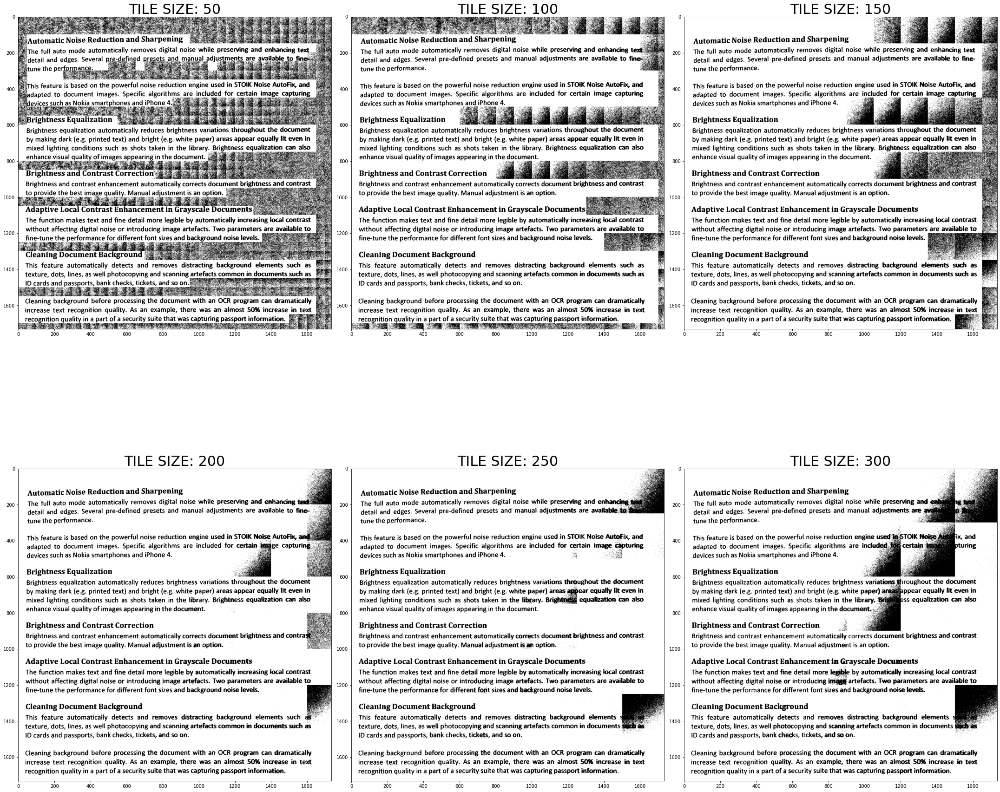

In [27]:
fig, ax = plt.subplots(2,3,figsize=(30,30))
# 0 -> 0 0 
# 1 -> 0 1
# 2 -> 0 2
# 3 -> 1 0
# 4 -> 1 1
# 5 -> 1 2

for i, tile_size in enumerate([50, 100, 150, 200, 250, 300]):
    otsu_res = run_otsu(tekst_Gray, tile_size)
    otsu_img = Image.fromarray(otsu_res)
    ax[int(i > 2)][i%3].imshow(otsu_img, cmap='gray')
    ax[int(i > 2)][i%3].set_title(f'TILE SIZE: {tile_size}', fontsize=30)
plt.tight_layout()

plt.savefig('otsu_localv1.png')


In [88]:
def otsu_local_overlapping(img, tile_size, tile_step):
    w,h = img.shape[0], img.shape[1]
    overlapping = []
    for y in range(0, w, tile_size):
        for x in range(0, h, tile_size):
            overlapping = []
            for i in range(tile_size // tile_step):
                for j in range(tile_size // tile_step):     
                    y_win_offset = i * tile_step
                    x_win_offset = j * tile_step
#                     print(f'{i}{j}: {y+y_win_offset}:{y+y_win_offset + tile_step} {x+x_win_offset}:{x+x_win_offset+tile_step}')
                    overlapping.append(img[y+y_win_offset: y+y_win_offset+tile_step,x+x_win_offset: x+x_win_offset+tile_step])
#             yield img[y:y+tile_size,x:x+tile_size], y, y+tile_size, x, x+tile_size
            yield overlapping, y, y+tile_size, x, x+tile_size
            
            

def run_otsu_overlap(img, tile_size,tile_step):
    tekst_copy = deepcopy(img)
    for tiles, y1, y2, x1, x2 in otsu_local_overlapping(tekst_Gray, tile_size, tile_step):
        thresholds = []
        for tile in tiles:
            otsu_threshold, result_img = cv2.threshold(tile, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
            thresholds.append(otsu_threshold)
            
        threshold_mean = np.median(thresholds)
        otsu_threshold, result_img = cv2.threshold(img[y1:y2, x1:x2], threshold_mean, 255, cv2.THRESH_BINARY)
        tekst_copy[y1:y2,x1:x2] = result_img
    return tekst_copy   

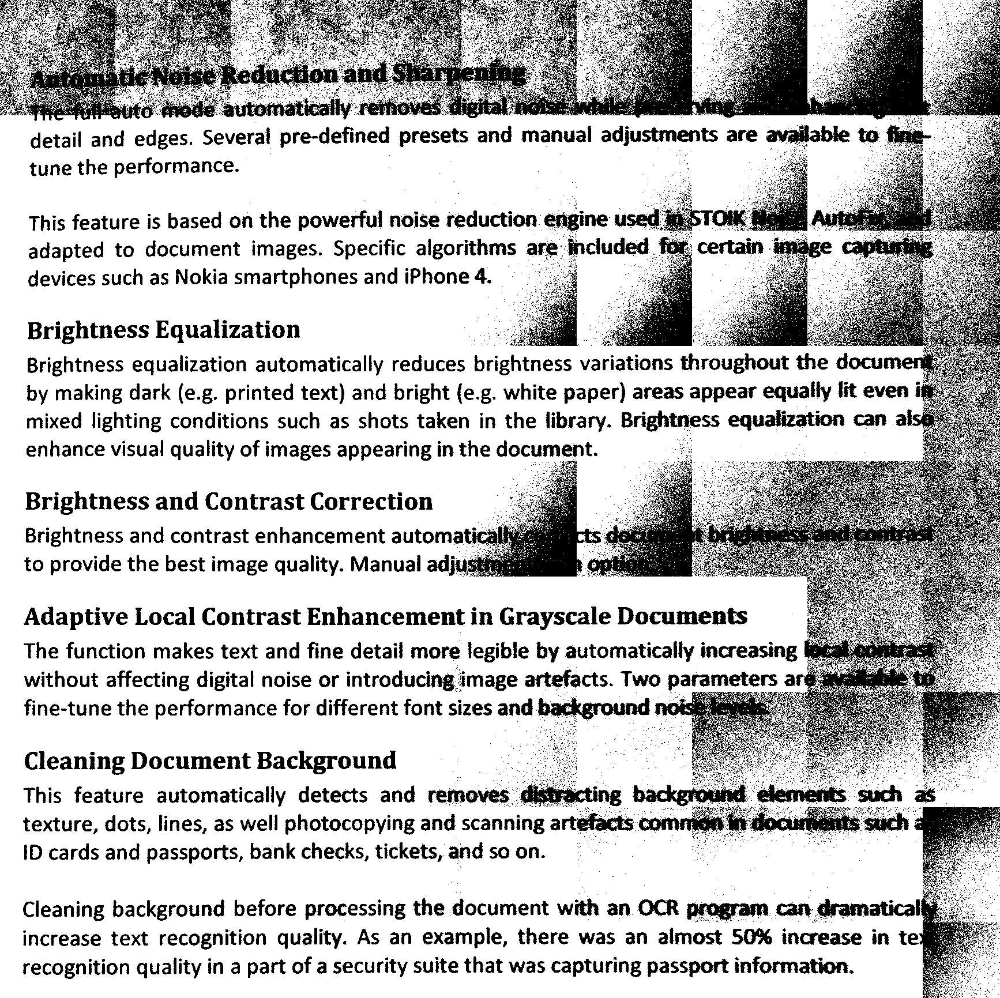

In [97]:
Image.fromarray(run_otsu_overlap(tekst_Gray,200, 30))

In [112]:
def otsu_local(img, tile_size):
    w,h = img.shape[0], img.shape[1]
    for y in range(0, w, tile_size):
        for x in range(0, h, tile_size):
            yield img[y:y+tile_size,x:x+tile_size], y, y+tile_size, x, x+tile_size

            
def run_otsu_var(img, tile_size, var):
    tekst_copy = np.full_like(img, 255)
    for tile, y1, y2, x1, x2 in otsu_local(img, tile_size):
        if np.var(tile) > var:
            otsu_threshold, result_img = cv2.threshold(tile, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
            tekst_copy[y1:y2,x1:x2] = result_img
    return tekst_copy

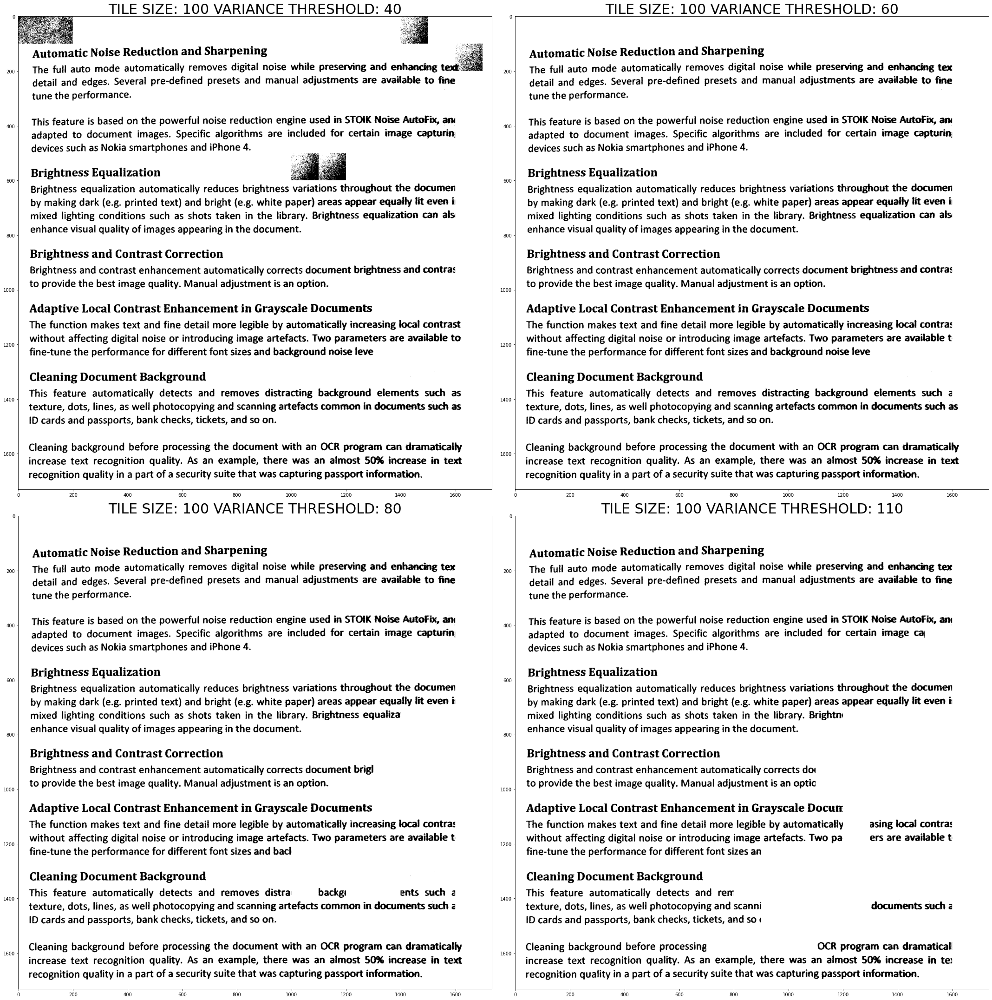

In [121]:
fig, ax = plt.subplots(2,2,figsize=(30,30))
# 0 -> 0 0 
# 1 -> 0 1
# 2 -> 1 0
# 3 -> 1 1
for i, var in enumerate([40, 60, 80, 110]):
    tile_size = 100
    otsu_res = run_otsu_var(tekst_Gray, tile_size, var)
    otsu_img = Image.fromarray(otsu_res)
    ax[int(i > 1)][i%2].imshow(otsu_img, cmap='gray')
    ax[int(i > 1)][i%2].set_title(f'TILE SIZE: {tile_size} VARIANCE THRESHOLD: {var}', fontsize=30)
plt.tight_layout()

plt.savefig('otsu_localv2.png')


### Ocenianie

**Najważniejsze**: Samo osiągnięcie "jakiegoś" wyniku (`cv2.threshold` odpalone, próg wybrany "z palca", _coś tam_ widać, wynik wyświetlony) to co najwyżej połowa sukcesu (i oceny). Ważne jest pokazanie w drodze eksperymentu odpowiedzi na pytania - czy te podane w treści zadania, czy takie, które Tobie się nasuwają.

W części 1 najbardziej istotne są dwa komponenty: jakość binaryzacji oraz usunięcie szumu. W sprawozdaniu interesujące mogą być:
* metoda doboru wartości progu,
* analiza zachowania algorytmu binaryzacji w zależności od wartości progu,
* ocena wpływu szumu na binaryzację,
* porównanie różnych metod redukcji szumu,
* ...

(wybierz jedno/dwie).

Część 2 jest podobna. Zwróć uwagę na nieco bardziej złożony sposób postępowania z obrazem kolorowym - w jaki sposób przeprowadzasz binaryzację? Co bierzesz pod uwagę, jak dobierasz próg, jak przeprowadzasz filtrację?

W ostatniej części mamy mniej kontroli nad samym algorytmem binaryzacji, ciekawsze jest jego użycie w sposób lokalny i wnioski płynące z eksperymentów nad tym.